In [1]:
import tensorflow as tf
from tensorflow.keras import initializers
import os
import numpy as np
from tqdm import tqdm
from skimage.io import imread,imshow
from skimage.transform import resize
import matplotlib.pyplot as plt
import random
seed = 25
np.random.seed = seed

img_width= 512
img_height= 512
img_channels=3

train_dir = r'C:\\Users\\praga\\amit_road_extraction\\341581_676539_bundle_archive\\road_segmentation_ideal\\train\\'
test_dir = r'C:\\Users\\praga\\amit_road_extraction\\341581_676539_bundle_archive\\road_segmentation_ideal\\test\\'
train_img_dir = os.path.join(train_dir,'images\\')
train_mask_dir = os.path.join(train_dir,'masks\\')
test_img_dir = os.path.join(test_dir,'images\\')
test_mask_dir = os.path.join(test_dir,'masks\\')

train_img_count = len(os.listdir(train_img_dir))
train_img_ids = os.listdir(train_img_dir)
train_mask_count = len(os.listdir(train_mask_dir))
train_mask_ids = os.listdir(train_mask_dir)
print('Train image count is',train_img_count,'and their ids are',train_img_ids)
print('Mask image count is',train_mask_count,'and their ids are',train_mask_ids)

test_img_count = len(os.listdir(test_img_dir))
test_img_ids = os.listdir(test_img_dir)
print('Test image count is',test_img_count,'and their ids are',test_img_ids)

X_train = np.zeros((train_mask_count,img_width,img_height,img_channels),dtype=np.uint8)
y_train = np.zeros((len(train_mask_ids),img_width,img_height,1),dtype=np.bool)

print('Resizing train images and masks')
for n,img_name in tqdm(enumerate(train_mask_ids),total=len(train_mask_ids)):
    path = train_img_dir + img_name
    img = imread(path)[:,:,:img_channels]
    img = resize(img,(img_width,img_height),mode='constant',preserve_range=True)
    X_train[n] = img
    mask = np.zeros((img_width,img_width,1),dtype=np.bool)
    msk = imread(train_mask_dir+img_name)
    msk = np.expand_dims(resize(msk,(img_width,img_height),mode='constant',preserve_range=True),axis=-1)
    mask = np.maximum(mask,msk)
    y_train[n] = mask


X_test = np.zeros((test_img_count,img_width,img_height,img_channels),dtype=np.uint8)
y_test_ground_truth = np.zeros((len(test_img_ids),img_width,img_height,1),dtype=np.bool)

print('Resizing test images')
for i,img_name in tqdm(enumerate(test_img_ids),total=len(test_img_ids)):
    path = test_img_dir + img_name
    img = imread(path)[:,:,:img_channels]
    img = resize(img,(img_width,img_height),mode='constant',preserve_range=True)
    X_test[i] = img
   
print('Resizing test masks')
for n,img_name in tqdm(enumerate(test_img_ids),total=len(test_img_ids)):
    mask = np.zeros((img_width,img_width,1),dtype=np.bool)
    msk = imread(test_mask_dir+img_name)
    msk = np.expand_dims(resize(msk,(img_width,img_height),mode='constant',preserve_range=True),axis=-1)
    mask = np.maximum(mask,msk)
    y_test_ground_truth[n] = mask

# Model Creating - u-net ::going downwards in UNet**************************************************************

inputs = tf.keras.layers.Input((img_width,img_height,img_channels))
s = tf.keras.layers.Lambda(lambda x: x/255)(inputs)

c1 = tf.keras.layers.Conv2D(16,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(s)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(c1)
p1 = tf.keras.layers.MaxPooling2D((2,2))(c1)

c2 = tf.keras.layers.Conv2D(32,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(c2)
p2 = tf.keras.layers.MaxPooling2D((2,2))(c2)

c3 = tf.keras.layers.Conv2D(64,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(c3)
p3 = tf.keras.layers.MaxPooling2D((2,2))(c3)

c4 = tf.keras.layers.Conv2D(128,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(c4)
p4 = tf.keras.layers.MaxPooling2D((2,2))(c4)


c5 = tf.keras.layers.Conv2D(256,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(p4)
c5 = tf.keras.layers.Dropout(0.2)(c5)
c5 = tf.keras.layers.Conv2D(256,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(c5)

#going upwards in UNet

u6 = tf.keras.layers.Conv2DTranspose(128,(2,2),strides=(2,2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6,c4])
c6 = tf.keras.layers.Conv2D(128,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(u6)
c6 = tf.keras.layers.Dropout(0.2)(c6)
c6 = tf.keras.layers.Conv2D(128,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(c6)

u7 = tf.keras.layers.Conv2DTranspose(64,(2,2),strides=(2,2), padding='same')(c6)
u7 = tf.keras.layers.concatenate([u7,c3])
c7 = tf.keras.layers.Conv2D(64,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(u7)
c7 = tf.keras.layers.Dropout(0.2)(c7)
c7 = tf.keras.layers.Conv2D(64,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(c7)

u8 = tf.keras.layers.Conv2DTranspose(32,(2,2),strides=(2,2), padding='same')(c7)
u8 = tf.keras.layers.concatenate([u8,c2])
c8 = tf.keras.layers.Conv2D(32,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(u8)
c8 = tf.keras.layers.Dropout(0.1)(c8)
c8 = tf.keras.layers.Conv2D(32,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(c8)

u9 = tf.keras.layers.Conv2DTranspose(16,(2,2),strides=(2,2), padding='same')(c8)
u9 = tf.keras.layers.concatenate([u9,c1],axis=3)
c9 = tf.keras.layers.Conv2D(16,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(u9)
c9 = tf.keras.layers.Dropout(0.1)(c9)
c9 = tf.keras.layers.Conv2D(16,(3,3),activation = 'relu',kernel_initializer='he_normal',padding='same')(c9)

outputs = tf.keras.layers.Conv2D(1,(1,1),activation='sigmoid')(c9)

model = tf.keras.Model(inputs=[inputs],outputs=[outputs])
model.compile(optimizer ='adam',loss='binary_crossentropy',metrics=['accuracy'])
model.summary()



  0%|                                                                                          | 0/804 [00:00<?, ?it/s]

Train image count is 1105 and their ids are ['img-1.png', 'img-10.png', 'img-100.png', 'img-1000.png', 'img-1001.png', 'img-1002.png', 'img-1003.png', 'img-1004.png', 'img-1005.png', 'img-1006.png', 'img-1007.png', 'img-1008.png', 'img-1009.png', 'img-101.png', 'img-1010.png', 'img-1011.png', 'img-1012.png', 'img-1013.png', 'img-1014.png', 'img-1015.png', 'img-1016.png', 'img-1017.png', 'img-1018.png', 'img-1019.png', 'img-102.png', 'img-1020.png', 'img-1021.png', 'img-1022.png', 'img-1023.png', 'img-1024.png', 'img-1025.png', 'img-1026.png', 'img-1027.png', 'img-1028.png', 'img-1029.png', 'img-103.png', 'img-1030.png', 'img-1031.png', 'img-1032.png', 'img-1033.png', 'img-1034.png', 'img-1035.png', 'img-1036.png', 'img-1037.png', 'img-1038.png', 'img-1039.png', 'img-104.png', 'img-1040.png', 'img-1041.png', 'img-1042.png', 'img-1043.png', 'img-1044.png', 'img-1045.png', 'img-1046.png', 'img-1047.png', 'img-1048.png', 'img-1049.png', 'img-105.png', 'img-1050.png', 'img-1051.png', 'img-1

100%|████████████████████████████████████████████████████████████████████████████████| 804/804 [06:19<00:00,  2.12it/s]


Resizing test images


 15%|████████████▊                                                                      | 2/13 [00:00<00:00, 12.24it/s]

Resizing test masks


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 13.69it/s]


Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
lambda (Lambda)                 (None, 512, 512, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 512, 512, 16) 448         lambda[0][0]                     
__________________________________________________________________________________________________
dropout (Dropout)               (None, 512, 512, 16) 0           conv2d[0][0]                     
_______________________________________________________________________________________

In [2]:
checkpoint = tf.keras.callbacks.ModelCheckpoint('road_extraction_v2.h5',verbose=1,save_best_only=True)
callbacks = [tf.keras.callbacks.TensorBoard(log_dir='logs')]

results = model.fit(X_train,y_train,validation_split=0.3,batch_size=2,epochs=15,callbacks=callbacks)


model.save_weights("road_extraction_saved_weights.h5")

Epoch 1/15
  1/281 [..............................] - ETA: 0s - loss: 0.7000 - accuracy: 0.4524WARNING:tensorflow:From C:\Users\praga\anaconda3\lib\site-packages\tensorflow\python\ops\summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
281/281 [==============================] - 850s 3s/step - loss: 0.2630 - accuracy: 0.9124 - val_loss: 0.3223 - val_accuracy: 0.8818
Epoch 2/15
281/281 [==============================] - 845s 3s/step - loss: 0.1991 - accuracy: 0.9271 - val_loss: 0.2568 - val_accuracy: 0.9086
Epoch 3/15
281/281 [==============================] - 849s 3s/step - loss: 0.1628 - accuracy: 0.9424 - val_loss: 0.2334 - val_accuracy: 0.9155
Epoch 4/15
281/281 [==============================] - 836s 3s/step - loss: 0.1439 - accuracy: 0.9495 - val_loss: 0.2359 - val_accuracy: 0.9199
Epoch 5/15
281/281 [==============================] - 842s 3s/

{'loss': [0.26304754614830017, 0.19911593198776245, 0.1628483384847641, 0.14387130737304688, 0.13473260402679443, 0.12639173865318298, 0.12027773261070251, 0.11845789104700089, 0.11356664448976517, 0.11194973438978195, 0.11009490489959717, 0.10927966982126236, 0.1052313968539238, 0.10511388629674911, 0.1040673702955246], 'accuracy': [0.9123579859733582, 0.9271109700202942, 0.9424198269844055, 0.9494515061378479, 0.9531177282333374, 0.9563241600990295, 0.958670973777771, 0.9594327807426453, 0.9611802101135254, 0.9618486762046814, 0.9623156785964966, 0.9625418186187744, 0.9638519883155823, 0.9640488624572754, 0.9644621014595032], 'val_loss': [0.32231956720352173, 0.25676411390304565, 0.2333756983280182, 0.2358834445476532, 0.1989041417837143, 0.18170426785945892, 0.2180224508047104, 0.1769447922706604, 0.1705377846956253, 0.17796297371387482, 0.18825854361057281, 0.17166590690612793, 0.16346776485443115, 0.16410019993782043, 0.1933961659669876], 'val_accuracy': [0.8817694783210754, 0.908

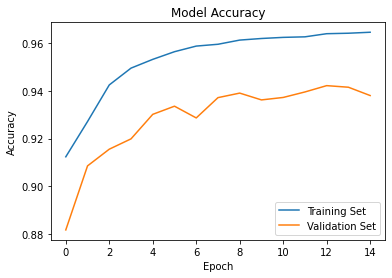

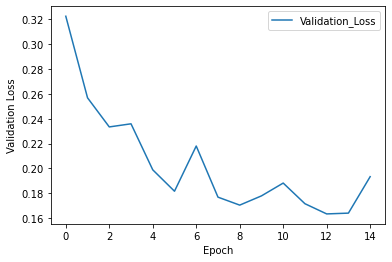

In [5]:
###############################
# Accuracy
print(results.history)
ax1 = plt.plot(results.history['accuracy'])
ax1 = plt.plot(results.history['val_accuracy'])
ax1 = plt.title('Model Accuracy')
ax1 = plt.ylabel('Accuracy')
ax1 = plt.xlabel('Epoch')
ax1 = plt.legend(['Training Set', 'Validation Set'])
plt.show()
ax2 = plt.plot(results.history['val_loss'])
ax2 = plt.ylabel('Validation Loss')
ax2 = plt.xlabel('Epoch')
ax2 = plt.legend(['Validation_Loss'])
plt.show()

In [41]:
y_test_ground_truth = np.zeros((len(test_img_ids),img_width,img_height,1),dtype=np.bool)

print('Resizing test masks')
for n,img_name in tqdm(enumerate(test_img_ids),total=len(test_img_ids)):
    mask = np.zeros((img_width,img_width,1),dtype=np.bool)
    msk = imread(test_mask_dir+img_name)
    msk = np.expand_dims(resize(msk,(img_width,img_height),mode='constant',preserve_range=True),axis=-1)
    mask = np.maximum(mask,msk)
    y_test_ground_truth[n] = mask

 15%|████████████▊                                                                      | 2/13 [00:00<00:00, 19.28it/s]

Resizing test masks


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 18.87it/s]


1/1 [==============================] - 0s 9ms/step


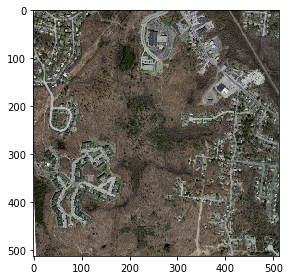

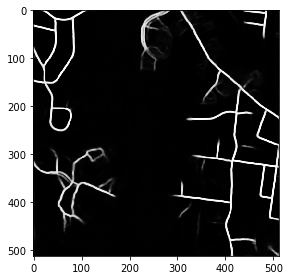

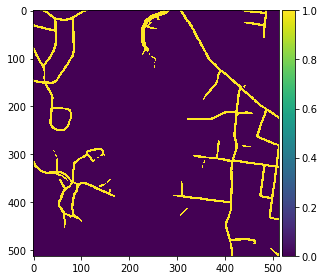

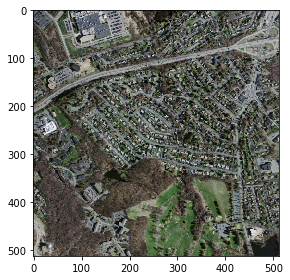

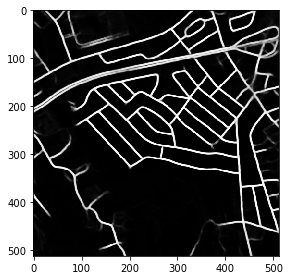

...

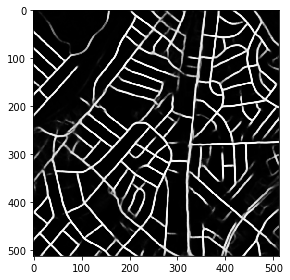

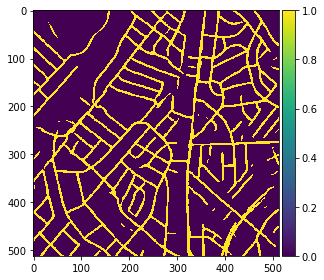

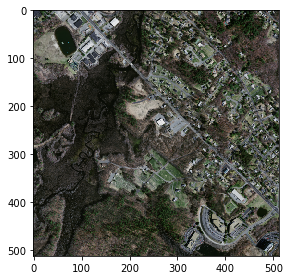

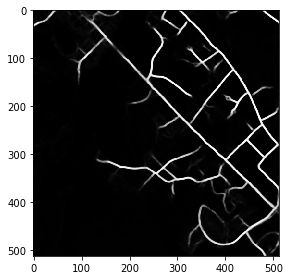

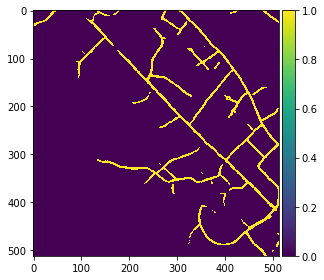

In [42]:
#####Prediction on some examples

idx = random.randint(0,len(X_train))

pred_train = model.predict(X_train[:int(X_train.shape[0]*0.9)],verbose=1)
pred_val = model.predict(X_train[int(X_train.shape[0]*0.9):],verbose=1)
pred_test = model.predict(X_test,verbose=1)

pred_train = model.predict(X_train[:int(X_train.shape[0]*0.9)],verbose=1)
pred_val = model.predict(X_train[int(X_train.shape[0]*0.9):],verbose=1)
pred_test = model.predict(X_test,verbose=1)

#Probability thresholds --------------------------------------------------------------------
pred_train_t = (pred_train>0.3).astype(np.uint8)
pred_val_t = (pred_val>0.3).astype(np.uint8)
pred_test_t = (pred_test>0.3).astype(np.uint8)

#checking performance on entire test set

for i in range(1,test_img_count):
    imshow(X_test[i])
    plt.show()
    imshow(np.squeeze(pred_test[i]))
    plt.show()
    imshow(np.squeeze(pred_test_t[i]))
    plt.show()
    



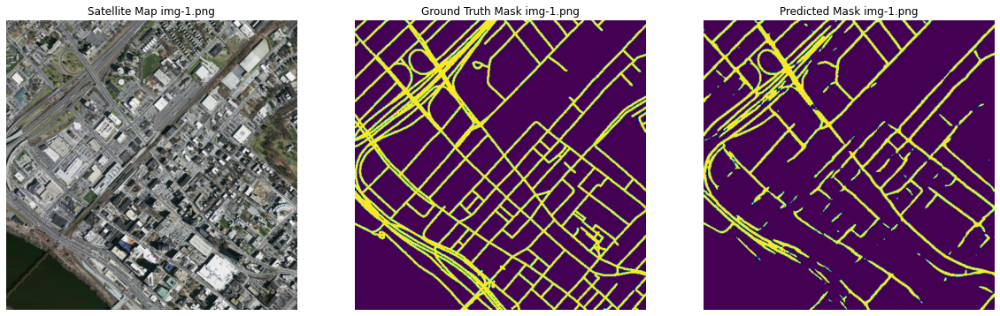

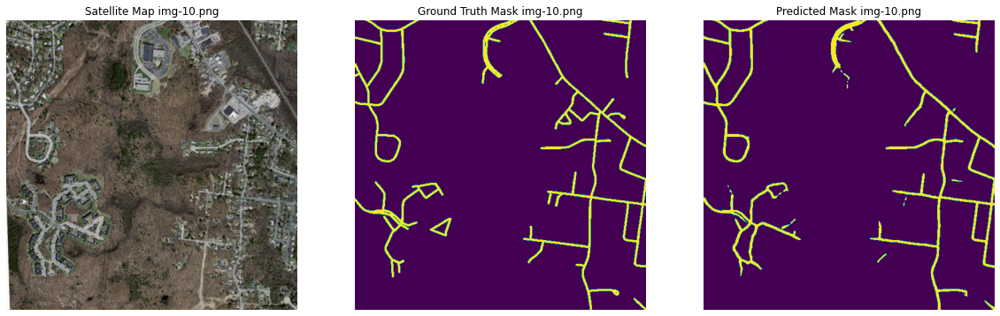

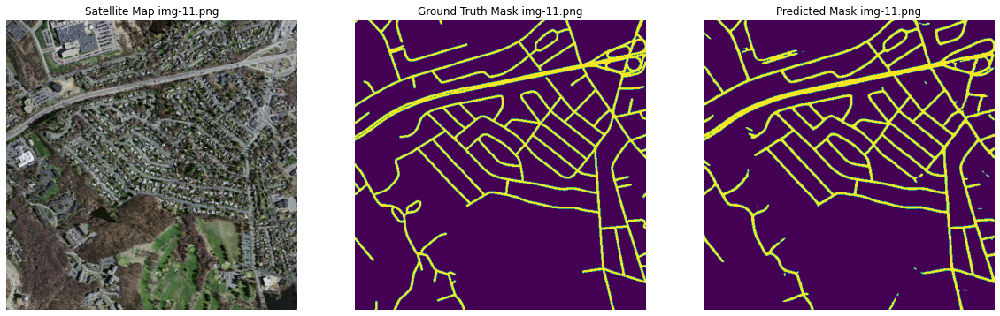

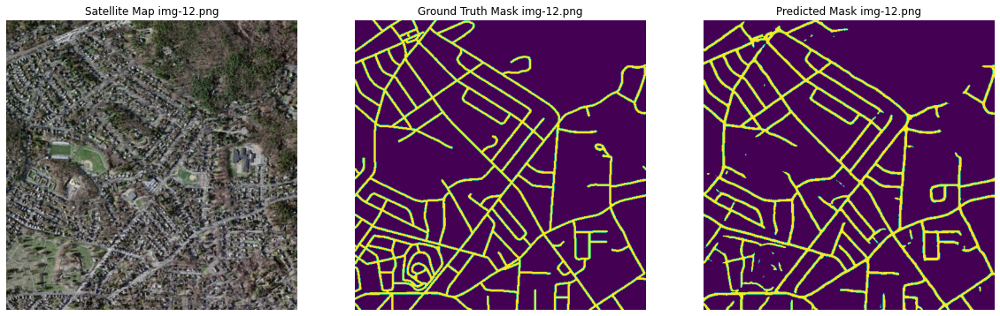

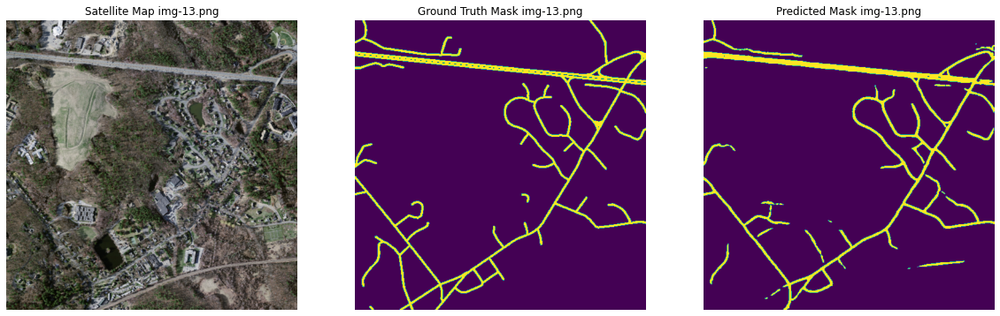

...

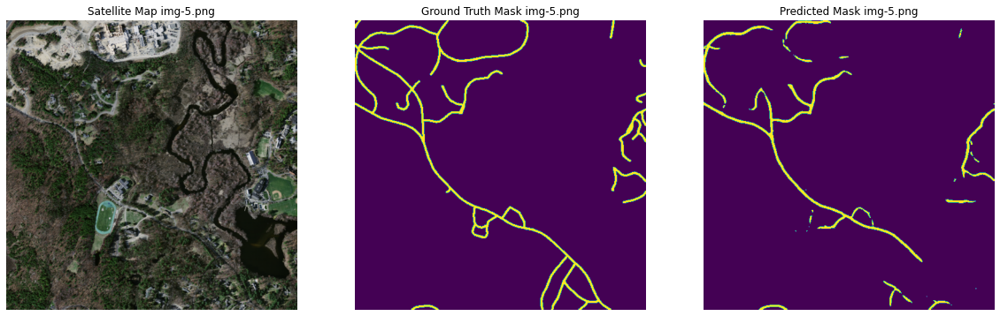

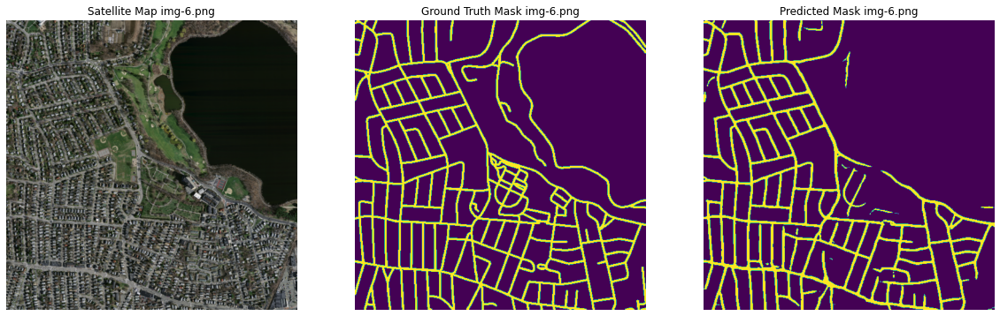

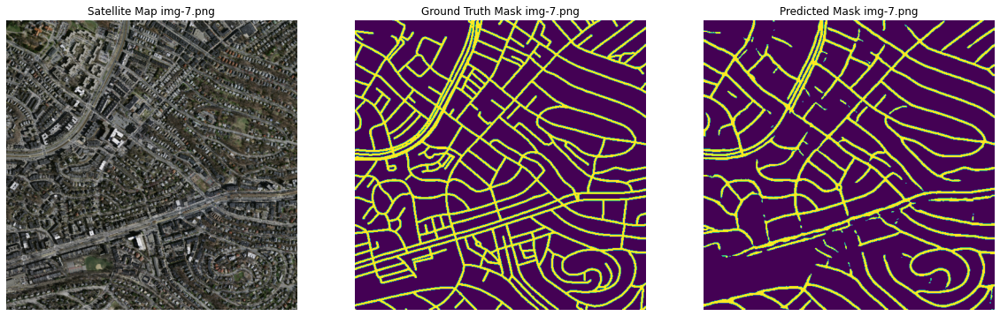

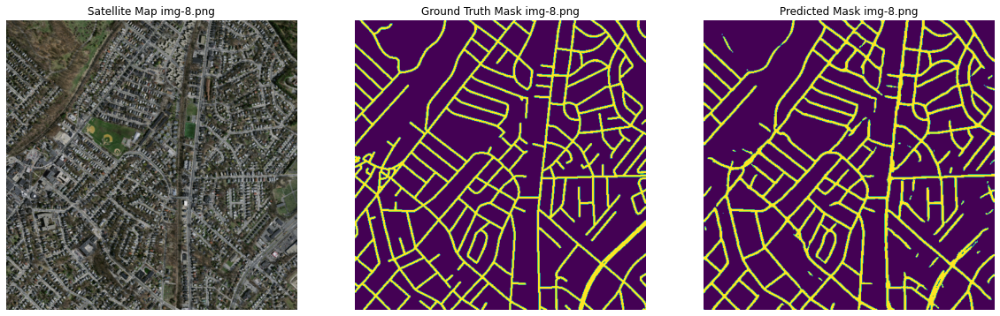

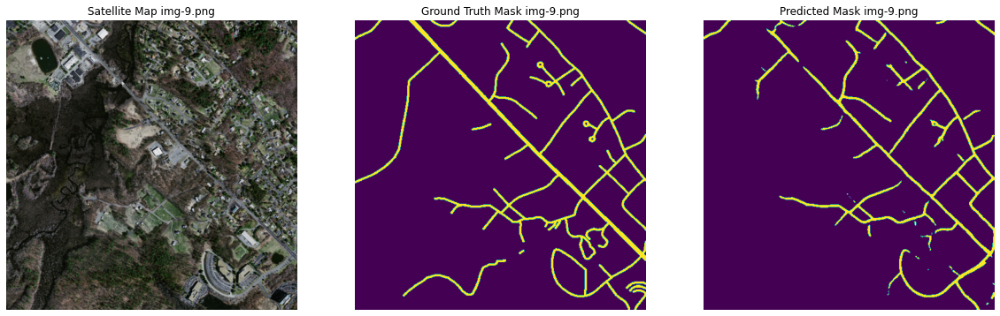

In [134]:
#checking performance on entire test set

for i in range(0,len(test_img_ids)):
    fig, ((ax0, ax1, ax2)) = plt.subplots(1,3, figsize=(20,7))

    ax0.imshow(X_test[i])
    ax0.axis('off')
    ax0.set_title('Satellite Map %s'%(test_img_ids[i]))

    ax1.imshow(np.squeeze(y_test_ground_truth[i]+0))
    ax1.axis('off')
    ax1.set_title('Ground Truth Mask %s'%(test_img_ids[i]))

    # continuous mask
    ax2.imshow(np.squeeze(pred_test_t[i]))
    ax2.axis('off')
    ax2.set_title('Predicted Mask %s'%(test_img_ids[i]))



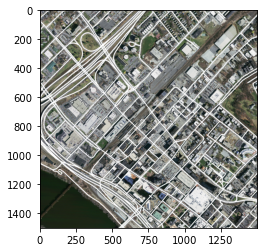

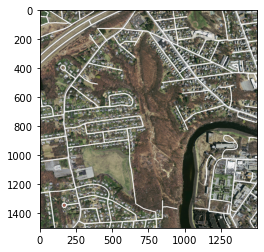

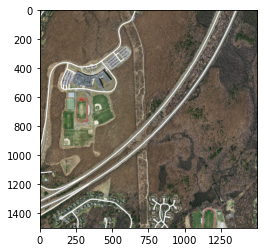

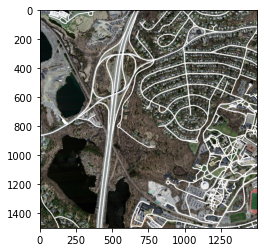

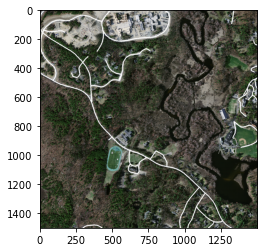

...

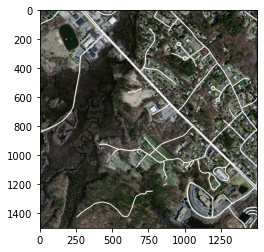

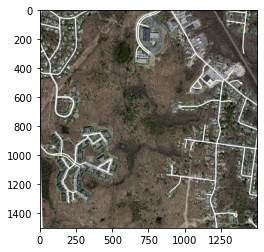

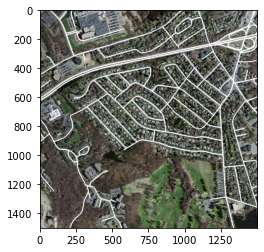

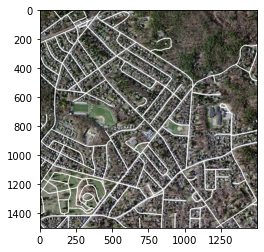

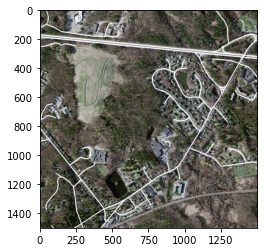

In [139]:
from PIL import Image
import matplotlib.cm

for i in range(0,len(test_img_ids)):
    mask = Image.open(test_mask_dir + 'img-%d.png'%(i+1))
    background = Image.open(test_img_dir+'img-%d.png'%(i+1))
    overlay=background.paste(mask, (0, 0),mask)
    background.save('ground_truth_overlay_img-%d.png'%(i+1),"PNG")
    plt.imshow(imread('ground_truth_overlay_img-%d.png'%(i+1)))
    plt.show()

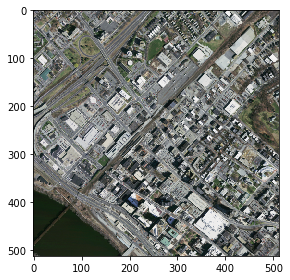

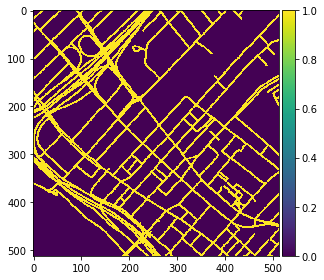

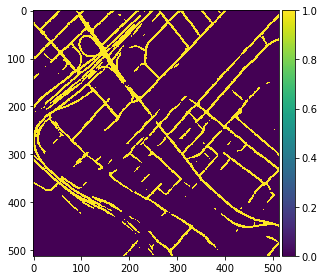

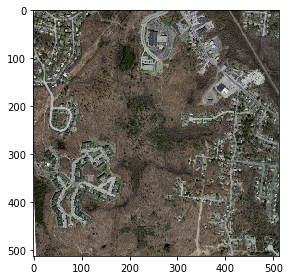

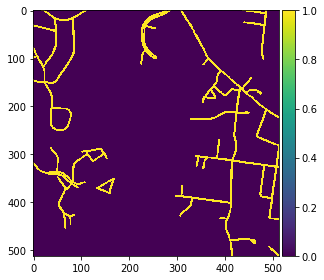

...

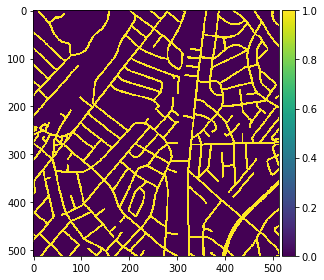

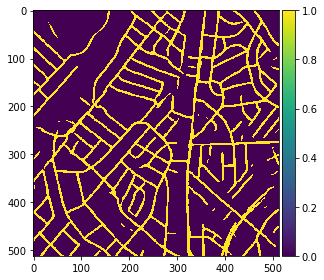

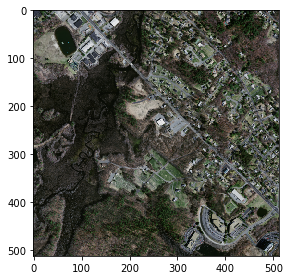

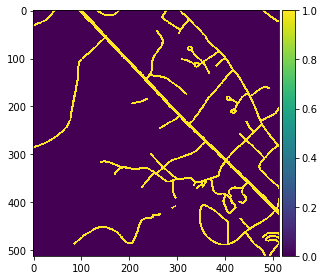

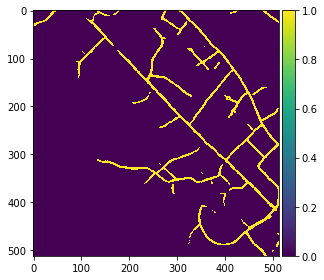

In [141]:
from PIL import Image
for i in range(0, len(test_img_ids)):
    imshow(X_test[i])
    plt.imsave('Satellite %s.png'%(test_img_ids[i]),X_test[i])
    plt.show()
    imshow(np.squeeze((y_test_ground_truth[i])+0))
    plt.imsave('ground_truth %s.png'%(test_img_ids[i]),np.squeeze(y_test_ground_truth[i]+0))
    plt.show()
    imshow(np.squeeze(pred_test_t[i]))
    plt.imsave('predicted %s.png'%(test_img_ids[i]),np.squeeze(y_test_ground_truth[i]+0))
    plt.show()
    

In [128]:
######### Metrics IOU
IOU_score=[]
for i in range(0, test_img_count):
    prediction=pred_test_t[i]
    target=y_test_ground_truth[i]
    intersection = np.logical_and(target, prediction)
    union = np.logical_or(target, prediction)
    iou_score = np.sum(intersection) / np.sum(union)
    IOU_score.append(iou_score)
    print(('IOU score for img-%d.png = '%(i+1))+('{:.2f} '.format((iou_score))))
    #print('{:.2f} %'.format((iou_score)))


IOU score for img-1.png = 0.48 
IOU score for img-2.png = 0.70 
IOU score for img-3.png = 0.72 
IOU score for img-4.png = 0.68 
IOU score for img-5.png = 0.65 
IOU score for img-6.png = 0.68 
IOU score for img-7.png = 0.68 
IOU score for img-8.png = 0.59 
IOU score for img-9.png = 0.45 
IOU score for img-10.png = 0.66 
IOU score for img-11.png = 0.55 
IOU score for img-12.png = 0.69 
IOU score for img-13.png = 0.58 
[0.47812286743584453, 0.6978563605069629, 0.7218449137995373, 0.6811079390677098, 0.6492597807073681, 0.6790221904473837, 0.6786542923433875, 0.5875501927802306, 0.4505057803468208, 0.6593594894823919, 0.553691033489377, 0.6911119425830811, 0.5804299815207103]


In [ ]:
from matplotlib import image
from matplotlib import pyplot
import numpy as np
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

rgb_weights=[0.2989, 0.5870, 0.1140]

for i in range(1, 13):    
    Ground_truth_mask = image.imread(r'C:\Users\praga\Desktop\test_pixel\ground_truth_%d.png'%i)
    Predicted_mask = image.imread(r'C:\Users\praga\Desktop\test_pixel\predicted_%d.png'%i)
    
    grayscale_Ground_truth_mask = np.dot(Ground_truth_mask[...,:3], rgb_weights)
    grayscale_Predicted_mask = np.dot(Predicted_mask[...,:3], rgb_weights)
    
    GT_mask_1d = grayscale_Ground_truth_mask.flatten()
    
    GT_mask_cat = (GT_mask_1d > 0.5).astype(np.uint8)
    #print(np.unique(GT_mask_cat))
    
    predicted_mask_1d = grayscale_Predicted_mask.flatten()

    predicted_mask_cat = (predicted_mask_1d > 0.5).astype(np.uint8)
    #print(np.unique(predicted_mask_cat))
    
    results = confusion_matrix(GT_mask_cat, predicted_mask_cat)
    
    print('Confusion Matrix of Test Image %i:'%i)
    print(results)
    print('Accuracy Score of Test Image %i :'%i,accuracy_score(GT_mask_cat, predicted_mask_cat))
    print('Classification Report of Test Image %i:'%i)
    print(classification_report(GT_mask_cat, predicted_mask_cat))